In [1]:
# add ASAP path to sys to locate the multiresolutionimageinterface
import sys
sys.path.append('/opt/ASAP/bin')
# required libraries
import multiresolutionimageinterface as mir
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from tqdm import tqdm_notebook

In [64]:
imagePath = './data/training/center_4/patient_092_node_1.tif'
maskPath = imagePath.replace('.tif', '_mask.tif')

# Pixel coordinates

# These coordinates have tumor in patient_004_node_4
x_center = 20000
y_center = 20000

# ...and these don't
#x_center = 12711
#y_center = 88578

# Fixed crop size
width = 256
height = 256

# Visualization scale for plotting
scale = 50
# Sample these levels, decreasing order
downsamples = [48,24,4,2,1]

reader = mir.MultiResolutionImageReader()
mr_image = reader.open(imagePath)
mr_mask = reader.open(maskPath)

In [65]:
def getSamplesWithAnnotations(x_cent, y_cent):
    channels = 3
    imgs = np.zeros((len(downsamples), width, height, channels), dtype=np.int32)
    masks = np.zeros((len(downsamples), width, height, channels), dtype=np.int32)
    for i, ds_size in enumerate(downsamples):
        lev = mr_image.getBestLevelForDownSample(ds_size)
        ds = mr_image.getLevelDownsample(lev)
        imgs[i] = mr_image.getUCharPatch(int(x_cent - (ds*width/2)),
                                         int(y_cent - (ds*height/2)),
                                         width,
                                         height,
                                         lev)
        masks[i] = mr_mask.getUCharPatch(int(x_cent - (ds*width/2)),
                                         int(y_cent - (ds*height/2)),
                                         width,
                                         height,
                                         lev)
    return imgs, masks

In [66]:
def isTumor(mask_level_0):
    return (mask_level_0.max() > 0)

def tumorPercentage(mask_level_0):
    area = mask_level_0.shape[0] * mask_level_0.shape[1]
    tumorPixels = 0
    channels = 3
    for p in mask_level_0.flatten():
        tumorPixels = tumorPixels + 1 if p == 1 else tumorPixels
    return tumorPixels / (area * channels)

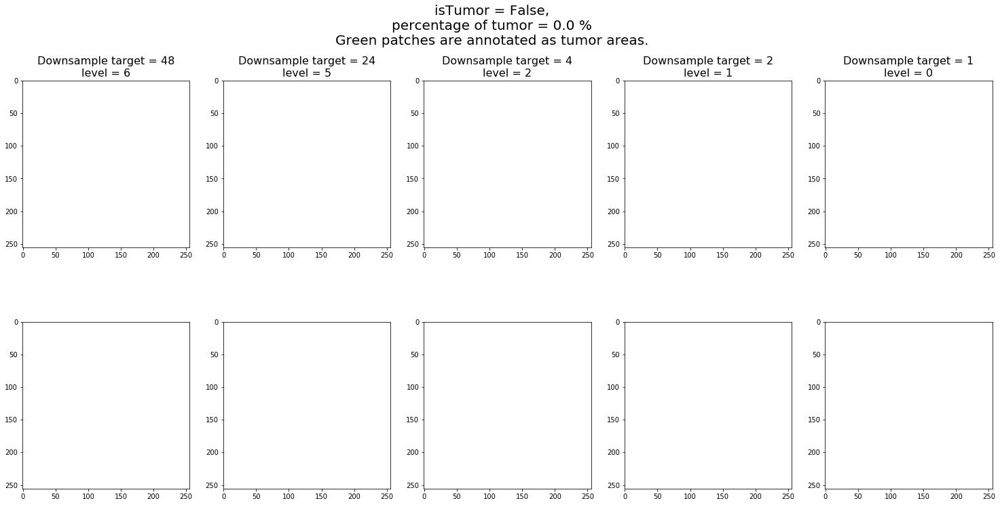

In [67]:
f, ax = plt.subplots(2,len(downsamples),figsize = (len(downsamples) * width / scale, int(2.5 * height / scale)))

imgs, masks = getSamplesWithAnnotations(x_cent=x_center,
                                        y_cent=y_center)
# check label from the lowest level
lbl = isTumor(masks[len(downsamples) - 1])
tumorPrc = tumorPercentage(masks[len(downsamples) - 1])
f.suptitle('isTumor = {0},\npercentage of tumor = {1} %\nGreen patches are annotated as tumor areas.'.format(lbl, int(tumorPrc * 1000)/10), fontsize=20)
alpha = 0.5

for i, ds_size in enumerate(downsamples):
    level = mr_image.getBestLevelForDownSample(ds_size)
    ax[0,i].imshow(imgs[i])
    
    # colorize
    mask_color = masks[i] * 200
    mask_color[:,:,[0,2]] = 0
    
    # create alpha channel to add to both images
    alpha_c = np.ones((mask_color.shape[0], mask_color.shape[1], 1), dtype=np.int32) * 255
    mask_color = np.concatenate([mask_color, alpha_c], axis=2)
    alpha_image = np.concatenate([imgs[i], alpha_c], axis=2)
    
    for x in range(mask_color.shape[0]):
        for y in range(mask_color.shape[1]):
            mask_color[x, y, 3] = 255 if mask_color[x, y, 2] == 1 else 0
            
    alpha_image = cv2.addWeighted(mask_color, 0.5, alpha_image, 1, 0)
    alpha_image = alpha_image.clip(min=0,max=255)
    ax[1,i].imshow(alpha_image)
    ax[0,i].set_title('Downsample target = {0}\nlevel = {1}'.format(ds_size, level), fontsize=16)

In [68]:
## This function is adapted from a digital pathology pipeline code of Mikko Tukiainen
def make_tissue_mask(slide, mask_level = 4, morpho=None, morpho_kernel_size=5, morpho_iter=1, median_filter=False, return_original = False): 
    ''' make tissue mask
        return tissue mask array which has tissue locations (pixel value 0 -> empty, 255 -> tissue)
    Args:
        slide (MultiResolutionImage): MultiResolutionImage slide to process
        mask_level (int): defines the level of zoom at which the mask be created (default 4)
        morpho (cv2.MORPHO): OpenCV morpho flag, Cv2.MORPHO_OPEN or Cv2.MORPHO_CLOSE (default None)
        morpho_kernel_size (int): kernel size for morphological transformation (default 5)
        morpho_iter (int): morphological transformation iterations (default=1)
        median_filtern (bool): Use median filtering to remove noise (default False)
        return_original (bool): return also the unmasked image
    '''
    
    ## Read the slide
    ds = slide.getLevelDownsample(mask_level)
    original_tissue = slide.getUCharPatch(0,
                                         0,
                                         int(slide.getDimensions()[0] / float(ds)),
                                         int(slide.getDimensions()[1] / float(ds)),
                                         mask_level)
    
    ## Determine the mask
    tissue_mask = cv2.cvtColor(np.array(original_tissue), cv2.COLOR_RGBA2RGB)
    tissue_mask = cv2.cvtColor(tissue_mask, cv2.COLOR_BGR2HSV)
    tissue_mask = tissue_mask[:, :, 1]
    _, tissue_mask = cv2.threshold(tissue_mask, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    if morpho is not None:
        kernel = np.ones((morpho_kernel_size,morpho_kernel_size), np.uint8)
        tissue_mask = cv2.morphologyEx(tissue_mask, morpho, kernel, iterations = morpho_iter)
        
    if median_filter:
        tissue_mask = cv2.medianBlur(tissue_mask, 15)
    
    tissue_mask = np.array(tissue_mask, dtype=np.uint8)

    if return_original:
        return tissue_mask, original_tissue
    else:
        return tissue_mask

In [69]:
def sample_centers(tissue_mask, mask_downscale=16, sample_side=256, focus_width_percentage=0.25, padding_percentage=0.01):
    mask_width, mask_height = tissue_mask.shape[:2]
    side = sample_side / mask_downscale
    padding_width = mask_width*padding_percentage
    padding_height = mask_height*padding_percentage
    half_focus = int(sample_side*focus_width_percentage / mask_downscale)
    sample_centers = []
    
    for i in range(int(mask_width // side)):
        for j in range(int(mask_height // side)):
            for sub_shift in [0, 0.5]:
                x = int((i+sub_shift) * side)
                y = int((j+sub_shift) * side)
                min_x = int(max(0, x - half_focus))
                max_x = int(min(x + half_focus, mask_width - 1))
                min_y = int(max(0, y - half_focus))
                max_y = int(min(y + half_focus, mask_height - 1))
                
                if(min_x < padding_width or max_x > mask_width-padding_width): continue
                if(min_y < padding_height or max_y > mask_height-padding_height): continue
                
                if(tissue_mask[min_x:max_x, min_y:max_y].sum() > 0):
                    sample_centers.append(np.array([x, y]))
                    
    # undo mask downscale to coordinates
    sample_centers = np.array(sample_centers) * mask_downscale
    return sample_centers

In [70]:
comparison_masks = []
comparison_mask_titles = []

otsu_mask, original_image = make_tissue_mask(mr_image, 
                                             mr_image.getBestLevelForDownSample(16), 
                                             return_original=True)

# replace black "empty" areas with white for cleaner visualization
#original_image[np.where((original_image < [18,18,18]).all(axis = 2))] = [252,252,252]    

comparison_mask_titles.append('Original tissue')
comparison_masks.append(original_image)
comparison_mask_titles.append('Otsu mask')
comparison_masks.append(otsu_mask)

comparison_mask_titles.append('Otsu mask\nMorphological closing (iter=1)')
comparison_masks.append(make_tissue_mask(mr_image, 
                                         mr_image.getBestLevelForDownSample(16), 
                                         morpho=cv2.MORPH_CLOSE,
                                         morpho_kernel_size=7,
                                         morpho_iter=1))

comparison_mask_titles.append('Otsu mask\nMorphological closing (iter=2)')
comparison_masks.append(make_tissue_mask(mr_image, 
                                         mr_image.getBestLevelForDownSample(16), 
                                         morpho=cv2.MORPH_CLOSE,
                                         morpho_kernel_size=7,
                                         morpho_iter=2))

comparison_mask_titles.append('Otsu mask\nMorphological closing (iter=2)\nMedian filter')
comparison_masks.append(make_tissue_mask(mr_image,
                                         mr_image.getBestLevelForDownSample(16), 
                                         morpho=cv2.MORPH_CLOSE,
                                         morpho_kernel_size=7,
                                         morpho_iter=2,
                                         median_filter=True))

CPU times: user 1min 37s, sys: 12.1 s, total: 1min 49s
Wall time: 13 s


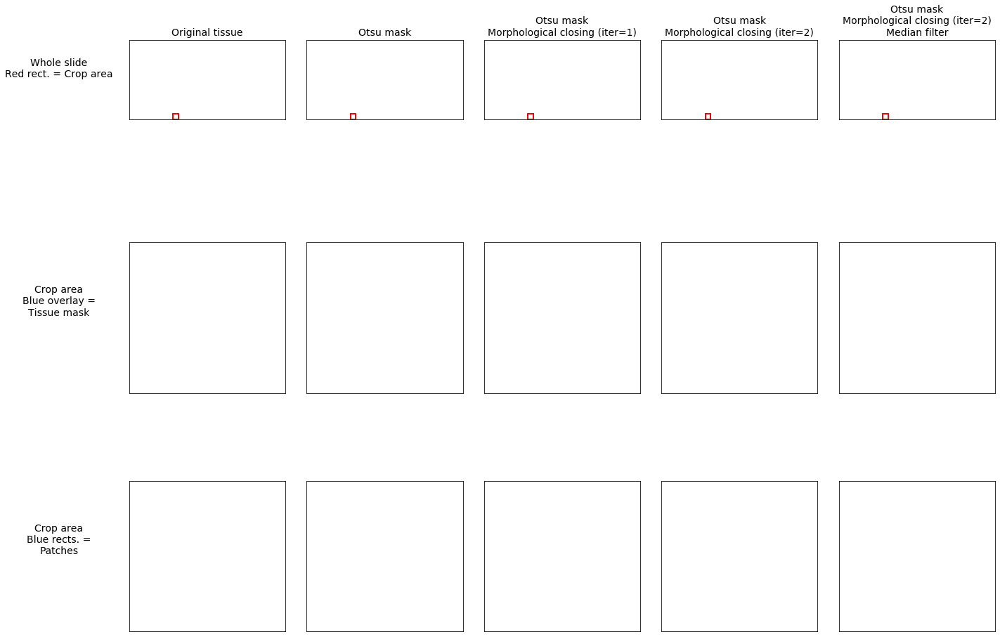

In [71]:
%%time
import matplotlib.patches as patches

# colormap for mask
from matplotlib import cm
from matplotlib.colors import ListedColormap
blues = cm.get_cmap('Blues', 256)
lightblue = blues(np.linspace(0, 1, 256))
lightblue[:100] = np.array([256/256,256/256,256/256,1])
turquoise = np.array([13/256,244/255,256/256,1])
turquoise_transparent = np.array([13/256,244/255,256/256,0.25])
lightblue[100:] = turquoise

f, ax = plt.subplots(3,len(comparison_masks),figsize=(20,15))
crop_x1 = 3300
crop_x2 = 3700
crop_y1 = 5600
crop_y2 = 6000
level_0_size = 256 / 16
fontsize_sz = 14
cmp = ListedColormap(lightblue)
alphaTissue = 1
alphaMask = 0.4

ax[0,0].imshow(comparison_masks[0], cmap=cmp)
ax[1,0].imshow(comparison_masks[0][crop_y1:crop_y2, crop_x1:crop_x2], cmap=cmp)
ax[2,0].imshow(comparison_masks[0][crop_y1:crop_y2, crop_x1:crop_x2], cmap=cmp)

for i in range(len(comparison_masks)):
    # draw first row
    if (i != 0):
        ax[0,i].imshow(comparison_masks[0], cmap=cmp, alpha=alphaTissue)
        ax[0,i].imshow(comparison_masks[i], cmap=cmp, alpha=alphaMask)
    ax[0,i].set_title(comparison_mask_titles[i], fontsize=fontsize_sz)
    crop_rect = patches.Rectangle((crop_x1,
                                   crop_y1),
                                  crop_x2-crop_x1,
                                  crop_y2-crop_y1,
                                  linewidth=2,
                                  edgecolor='r',
                                  facecolor='none')
    ax[0,i].add_patch(crop_rect)
    
    # draw second row
    if (i != 0):
        ax[1,i].imshow(comparison_masks[0][crop_y1:crop_y2, crop_x1:crop_x2], cmap=cmp, alpha=alphaTissue)
        ax[1,i].imshow(comparison_masks[i][crop_y1:crop_y2, crop_x1:crop_x2], cmap=cmp, alpha=alphaMask)
    
    # draw third row
    if (i != 0):
        sample_c_pts = sample_centers(comparison_masks[i][crop_y1:crop_y2, crop_x1:crop_x2],
                                      mask_downscale=1,
                                      sample_side=level_0_size,
                                      padding_percentage=0)
        ax[2,i].imshow(comparison_masks[0][crop_y1:crop_y2, crop_x1:crop_x2], cmap=cmp, alpha=1)
        for pt in sample_c_pts:
            window_rect = patches.Rectangle((pt[1] - (level_0_size)/2,
                                             pt[0] - (level_0_size)/2),
                                            level_0_size,
                                            level_0_size,
                                            linewidth=0.5,
                                            edgecolor=turquoise,
                                            facecolor=turquoise_transparent)
            ax[2,i].add_patch(window_rect)
    
    # hide ticks
    for j in range(3):
        ax[j, i].xaxis.set_major_locator(plt.NullLocator())
        ax[j, i].yaxis.set_major_locator(plt.NullLocator())
        
ax[0,0].set_ylabel('Whole slide\nRed rect. = Crop area', fontsize=fontsize_sz, rotation=0, labelpad=100)
ax[1,0].set_ylabel('Crop area\nBlue overlay =\nTissue mask', fontsize=fontsize_sz, rotation=0, labelpad=100)
ax[2,0].set_ylabel('Crop area\nBlue rects. =\nPatches', fontsize=fontsize_sz, rotation=0, labelpad=100)
plt.tight_layout()

IndexError: too many indices for array

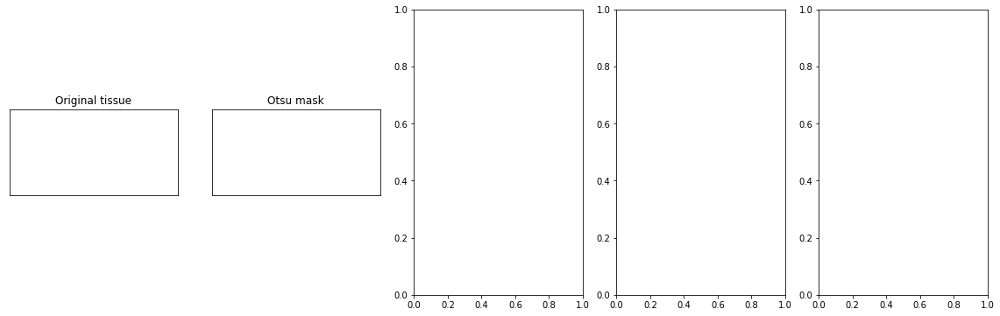

In [72]:
%%time
fontsize_sz = 12
f, ax = plt.subplots(1,len(comparison_masks),figsize=(20,6))
for i in range(len(comparison_masks)):
    ax[i].imshow(comparison_masks[0], cmap=cmp)
    ax[i].set_title(comparison_mask_titles[i], fontsize=fontsize_sz)
    ax[i].xaxis.set_major_locator(plt.NullLocator())
    ax[i].yaxis.set_major_locator(plt.NullLocator())
    if (i>0):
        sample_c_pts = sample_centers(comparison_masks[i],
                                              mask_downscale=1,
                                              sample_side=level_0_size)

        ax[i].scatter(sample_c_pts[:,1], sample_c_pts[:,0], s=0.2, color=turquoise_transparent, alpha=0.1)

## Plot center 4 images

In [74]:
import pandas as pd
df_center4 = pd.read_csv('./data/training/test.csv')
df_center4.head()

,Unnamed: 0,patchId,fileName,center,patient,node,centerX,centerY,isTumor,tumorPercentage,tissuePercentage,meanHue,meanSaturation,meanValue,tumorLabel
0,4622,80000596480082176,data/training/center_4/patient_080_node_3.tif,4,80,3,59648,82176,False,0.0,75.7,0.78,0.19,0.87,False
1,8340,84000495360117632,data/training/center_4/patient_084_node_1.tif,4,84,1,49536,117632,False,0.0,100.0,0.92,0.16,0.82,False
2,5919,84000295680130432,data/training/center_4/patient_084_node_0.tif,4,84,0,29568,130432,False,0.0,53.1,0.86,0.06,0.88,False
3,6357,82000494080056832,data/training/center_4/patient_082_node_4.tif,4,82,4,49408,56832,False,0.0,100.0,0.87,0.19,0.80,False
4,4844,80000730880039552,data/training/center_4/patient_080_node_3.tif,4,80,3,73088,39552,False,0.0,100.0,0.92,0.21,0.74,False


In [77]:
from PIL import Image

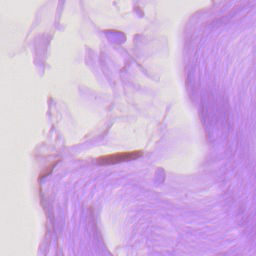

In [82]:
Image.open('data/patches/' + str(df_center4.patchId.values[0]) + '_0.png')

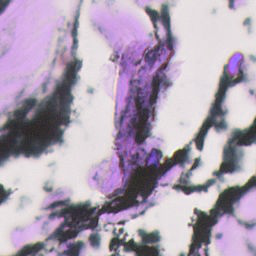

In [101]:
Image.open('data/patches/' + str(df_center4.patchId.values[2127]) + '_0.png')

In [105]:
df_center4.iloc[2127]

Unnamed: 0                                                   6152
patchId                                         84000768000086016
fileName            data/training/center_4/patient_084_node_2.tif
center                                                          4
patient                                                        84
node                                                            2
centerX                                                     76800
centerY                                                     86016
isTumor                                                     False
tumorPercentage                                                 0
tissuePercentage                                              100
meanHue                                                      0.78
meanSaturation                                                0.1
meanValue                                                     0.7
tumorLabel                                                  False
Name: 2127

In [84]:
pth_strs = df_center4.patchId.values
pth_strs

array([80000596480082176, 84000495360117632, 84000295680130432, ...,
       99000165120084096, 99000090880077184, 99000211200075392])

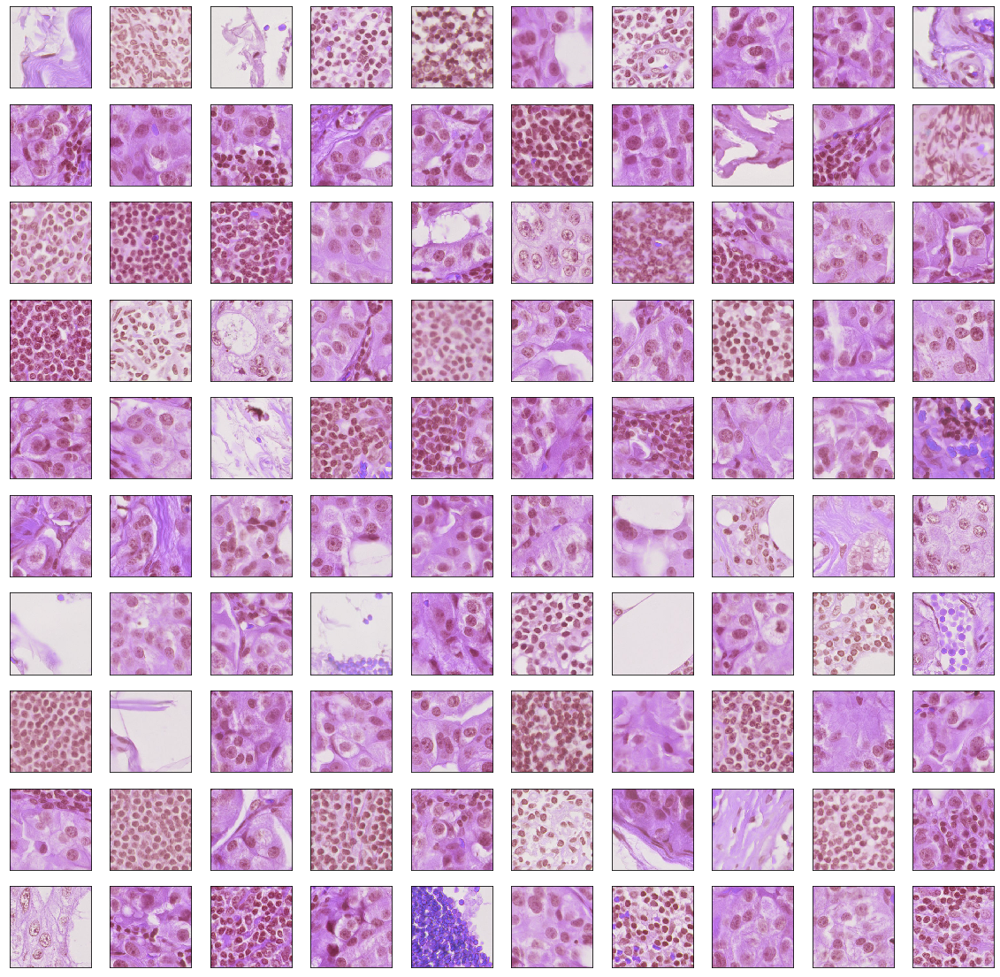

In [90]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(10,10,figsize=(20,20))

start_ind = 0

for i in range(10):
    for j in range(10):
        ax[i,j].imshow(Image.open('data/patches/' + str(pth_strs[start_ind + i*10 + j]) + '_0.png'))
        ax[i,j].xaxis.set_major_locator(plt.NullLocator())
        ax[i,j].yaxis.set_major_locator(plt.NullLocator())

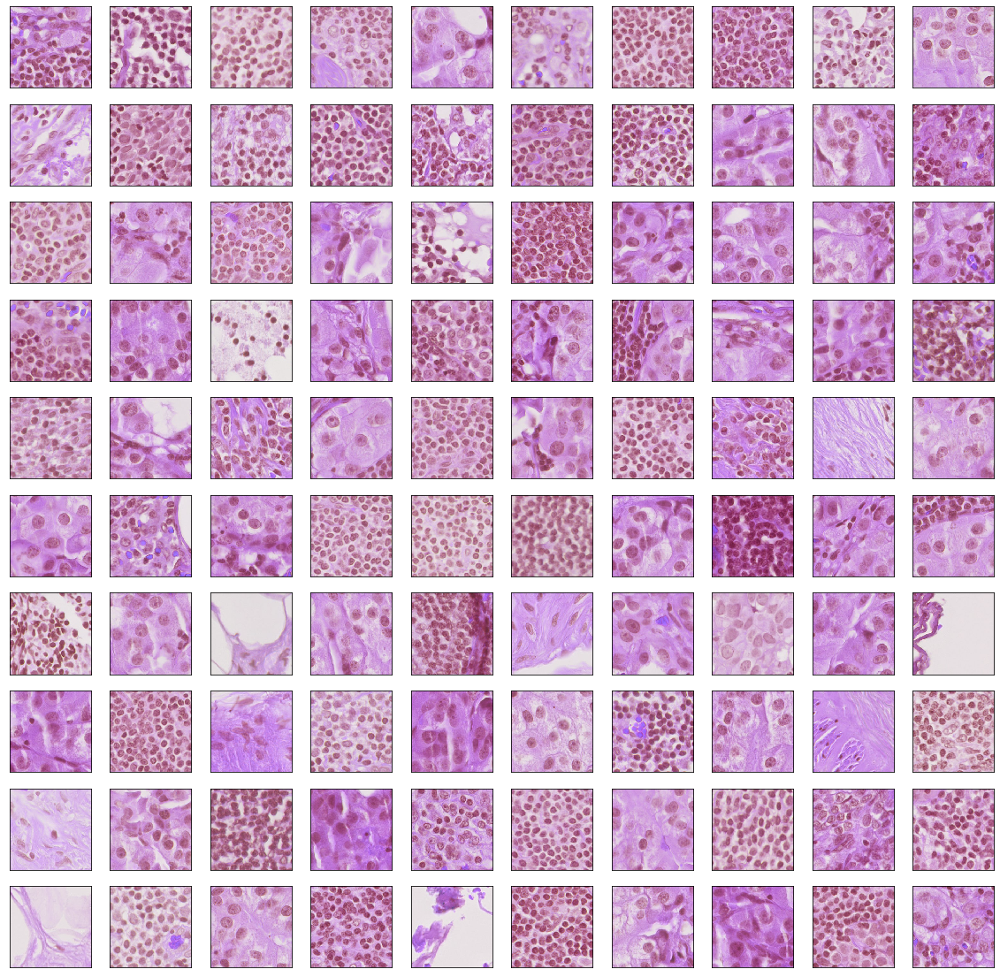

In [91]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(10,10,figsize=(20,20))

start_ind = 100

for i in range(10):
    for j in range(10):
        ax[i,j].imshow(Image.open('data/patches/' + str(pth_strs[start_ind + i*10 + j]) + '_0.png'))
        ax[i,j].xaxis.set_major_locator(plt.NullLocator())
        ax[i,j].yaxis.set_major_locator(plt.NullLocator())

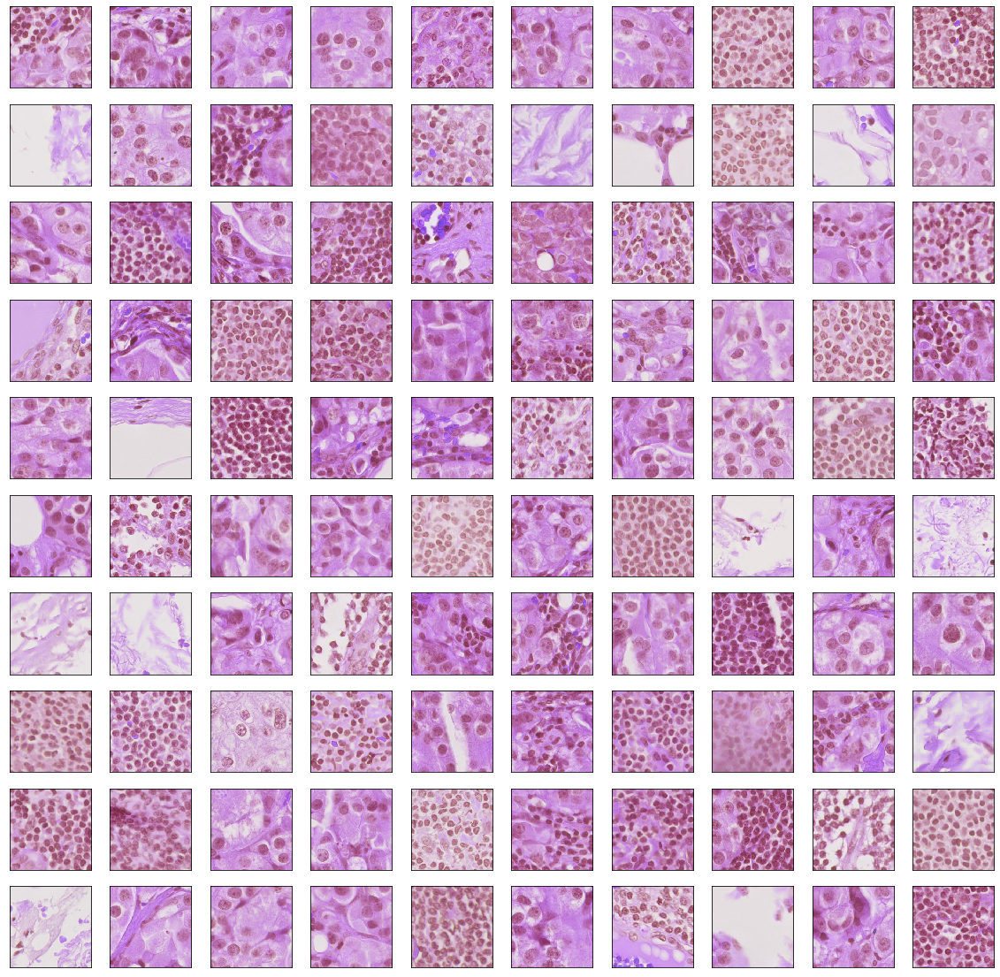

In [96]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(10,10,figsize=(20,20))

start_ind = 8000

for i in range(10):
    for j in range(10):
        ax[i,j].imshow(Image.open('data/patches/' + str(pth_strs[start_ind + i*10 + j]) + '_0.png'))
        ax[i,j].xaxis.set_major_locator(plt.NullLocator())
        ax[i,j].yaxis.set_major_locator(plt.NullLocator())

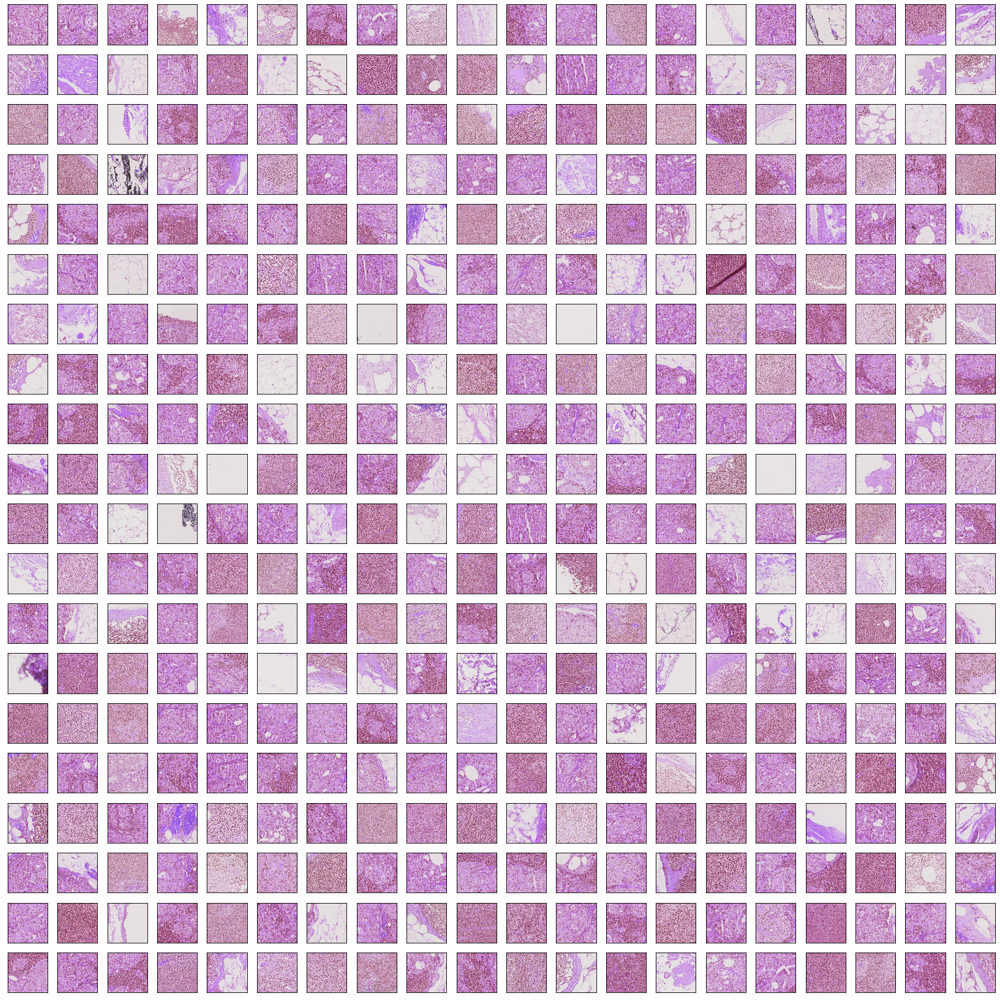

In [106]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(20,20,figsize=(20,20))

start_ind = 2000

for i in range(20):
    for j in range(20):
        ax[i,j].imshow(Image.open('data/patches/' + str(pth_strs[start_ind + i*20 + j]) + '_2.png'))
        ax[i,j].xaxis.set_major_locator(plt.NullLocator())
        ax[i,j].yaxis.set_major_locator(plt.NullLocator())
plt.tight_layout()